# **DOCKING using Autodock**
## **Brief Introduction about autodock**
Ref: [Morris, G. M., Huey, R., Lindstrom, W., Sanner, M. F., Belew, R. K., Goodsell, D. S. and Olson, A. J. (2009) Autodock4 and AutoDockTools4: automated docking with selective receptor flexiblity. J. Computational Chemistry 2009, 16: 2785-91.](https://pubmed.ncbi.nlm.nih.gov/19399780/)

In Autodock first a grid is created on the entire protein or binding site of the protein. Different atoms of the possible ligand (C, N,O, S, H) are considered as probe atoms roll over on the surface of the protein within the grid, and interaction energy between the atoms for each grid point is calculated and stored in grid files.


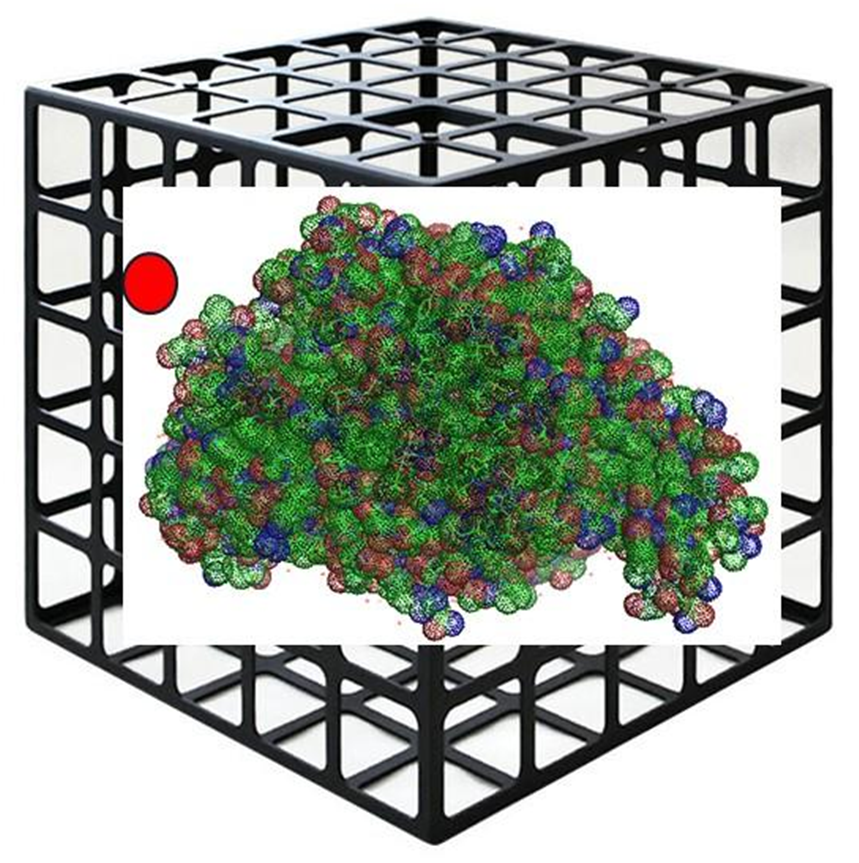


In the second step, the conformational space available for ligand-receptor system is explored and scoring is performed.

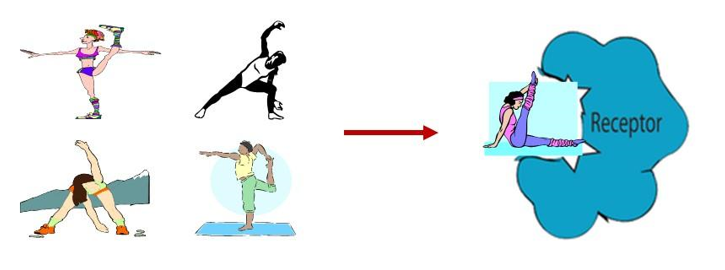


For generating different poses or shapes of the molecule (conformational search), Autodock adopts a Genetic Algorithm. Ligand translation, rotation, and configuration variables constitute the genes. The energy scoring function determines fitness. If the ligand-receptor interaction energy is positive, the conformation or pose is removed; if the ligand-receptor interaction energy is negative, the pose is passed over to the next generation (fitness)

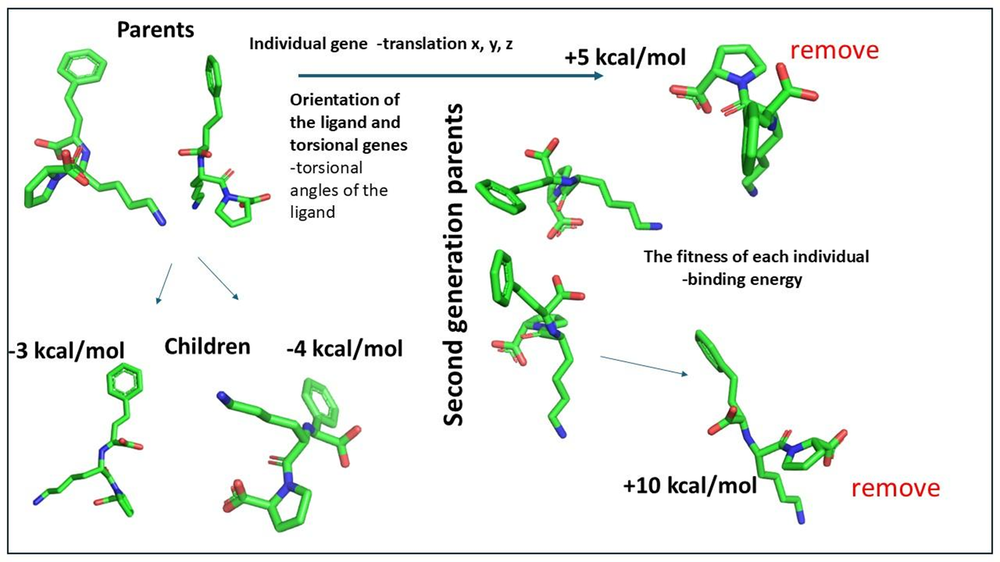


The empirical scoring function is used to calculate the ligand-receptor interaction fit


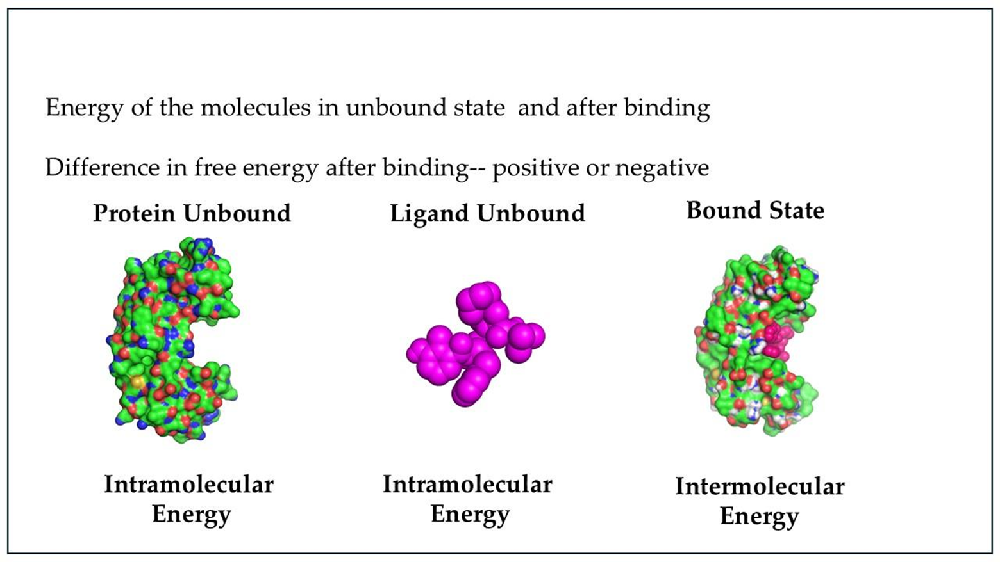


Change in free energy upon binding is used as a criterion for the selection of low-energy structures in the docking pose.
 ΔG=-RTlnKd
Visually, the free energy change between solvated and bound state  is calculated.
`ΔG=-RTlnKd`
Visually, the free energy change between solvated and bound states  is calculated.


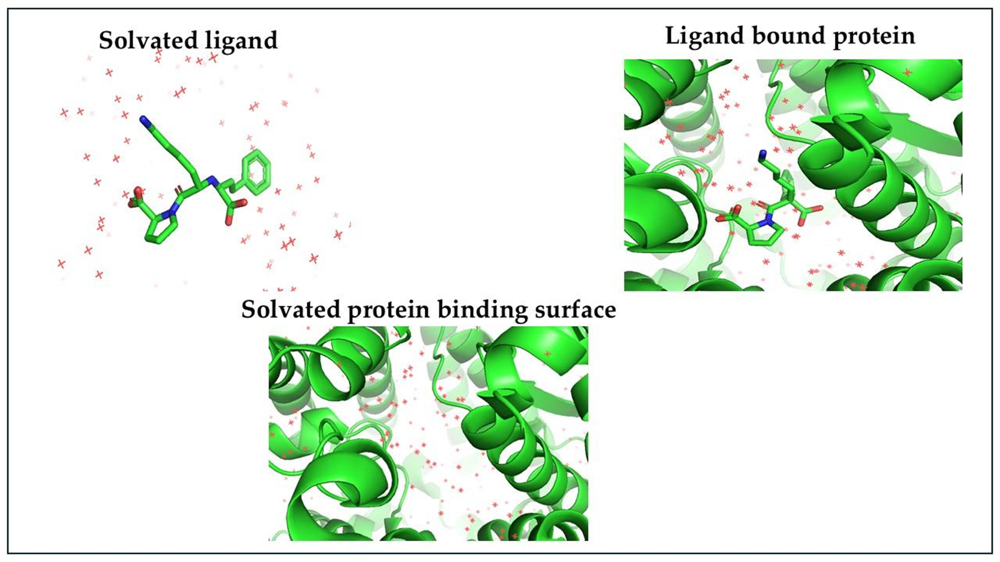

# ⏭ **Step 1 Before Docking**
## **Binding site**
In the case of enzymes, the binding site of substrate in the enzyme is known. In some cases, the binding site on the protein is not known. In such cases, we have to predict the possible binding site.

### 🌟 **Activity: Analyzing and Preparing the HIV Protease Enzyme for Binding Site Analysis Using PyMOL**

This activity involves identifying and preparing the binding site of the HIV protease enzyme using PyMOL. It focuses on removing the ligand and other unwanted molecules, then saving the cleaned protein structure for further docking or analysis.

### **Objectives**
1. Identify the binding site of HIV protease enzyme using PyMOL.
2. Remove the ligand and prepare the protein structure for binding site analysis.
3. Save the cleaned protein structure in PDB format.

### **Instructions**

#### **1. Download the Protein Structure**
   - Open **PyMOL**.
   - Go to the top menu: **File > Get PDB > Enter PDB ID**.
   - Enter `1QBR` and download the structure.
   - Alternatively, download the structure from the [PDB website](https://www.rcsb.org/structure/1QBR) and open it in PyMOL using **File > Open**.

#### **2. Display the Sequence**
   - On the top menu, click **Display > Sequence**.
   - The sequence bar will appear at the top, showing residues and any bound molecules like ligands and water.

#### **3. Identify and Remove the Ligand**
   - In the sequence view, locate **XV6**, the ligand in the binding site.
   - Click on **XV6** in the sequence bar to select it.
   - On the right side menu, click **Action > Remove Atoms** to delete the ligand.

#### **4. Remove Unwanted Molecules (Water and Solvents)**
   - Use PyMOL commands or the menu to remove water and other solvent molecules:
      In the **Command Line** (bottom of the PyMOL window):
       ```bash
       remove solvent
       ```
     Or, from the right-side menu:
       - Select **Heteroatoms** (non-protein molecules like water or salts).
       - Choose **Action > Remove Atoms**.

#### **5. Ensure Only Protein is Displayed**
   - Verify that only the protein structure is visible by checking the right-side menu.
   - Use **Hide > Everything** and then **Show > Cartoon** to display the protein structure.

#### **6. Export the Cleaned Protein Structure**
   - Go to **File > Export Molecule**.
   - Select **Save Type as PDB**.
   - Name the file (e.g., `hivbinding.pdb`) and save it to your desired directory.

### **Command Mode: Automating the Steps**
This activity can be performed using PyMOL's command mode, which allows you to script and automate the process. Here's a command-based workflow:

```python
# Load the protein structure
fetch 1QBR, async=0

# Remove ligand (XV6), water, and solvents
remove resn XV6
remove solvent

# Ensure only protein is displayed
hide everything
show cartoon

# Save the cleaned structure
save hivbinding.pdb
```

### **Outcome**
- You now have a cleaned PDB file (`hivbinding.pdb`) containing only the HIV protease receptor.
- This structure is ready for further analysis, including docking or visualization of the binding site.

## **PML Script: Preparing HIV Protease Enzyme for Docking**

In [7]:
# PML Script: Proper Docking Visualization

with open("2.2 Docking_Protein_Ligand_Analysis.pml", "w") as scriptout:
    # Step 1: Fetch and Clean the Receptor Protein
    scriptout.write("# Step 1: Load the Receptor Protein\n")
    scriptout.write("fetch 1HSG, receptor, async=0\n")  # Fetch receptor protein (HIV Protease)
    scriptout.write("hide everything, all\n")  # Hide all default representations
    scriptout.write("show cartoon, receptor\n")  # Show receptor as cartoon
    scriptout.write("color cyan, receptor\n")  # Color receptor cyan

    # Step 2: Extract and Visualize the Ligand from the PDB
    scriptout.write("# Step 2: Load and Isolate the Ligand\n")
    scriptout.write("select ligand, organic\n")  # Select organic ligand molecules
    scriptout.write("show sticks, ligand\n")  # Show the ligand as sticks
    scriptout.write("color yellow, ligand\n")  # Color ligand yellow
    scriptout.write("zoom ligand\n")  # Zoom in on the ligand for clarity

    # Step 3: Highlight Binding Site Residues Around Ligand
    scriptout.write("# Step 3: Select Binding Site Residues\n")
    scriptout.write("select binding_site, byres (ligand around 5)\n")  # Select residues within 5 Å of ligand
    scriptout.write("show sticks, binding_site\n")  # Show binding site residues in sticks
    scriptout.write("color magenta, binding_site\n")  # Color binding site residues magenta

    # Step 4: Visualize Interactions
    scriptout.write("# Step 4: Measure and Display Interactions\n")
    scriptout.write("distance interactions, ligand, binding_site\n")  # Measure distances between ligand and binding site
    scriptout.write("set dash_color, red, interactions\n")  # Set distance dashes red for visibility

    # Step 5: Surface Representation for Receptor and Transparency
    scriptout.write("# Step 5: Display Receptor Surface and Adjust Transparency\n")
    scriptout.write("show surface, receptor\n")  # Show surface of receptor protein
    scriptout.write("set transparency, 0.5, receptor\n")  # Set receptor surface transparency to 50%

    # Step 6: Final View and Cleanup
    scriptout.write("# Step 6: Optimize Visualization and Save Output\n")
    scriptout.write("zoom (ligand or binding_site)\n")  # Zoom into the docking region
    scriptout.write("orient\n")  # Optimize orientation for display
    scriptout.write("png docking_visualization.png, dpi=300\n")  # Save the final visualization as PNG

    # Notes for Analysis
    scriptout.write("# Notes:\n")
    scriptout.write("# - Receptor: HIV Protease (PDB ID: 1HSG)\n")
    scriptout.write("# - Ligand: Benzamidine (extracted from 1HSG structure)\n")
    scriptout.write("# - Binding site residues are highlighted in magenta.\n")
    scriptout.write("# - Distances between ligand and binding site are displayed as red dashes.\n")
    scriptout.write("# - The output visualization is saved as 'docking_visualization.png'.\n")

    scriptout.write("cmd.hide('angles', 'interactions')\n")  # Hide angles
    scriptout.write("cmd.hide('dihedrals', 'interactions')\n")  # Hide dihedrals
    scriptout.write("cmd.hide('dashes', 'interactions')\n")  # Hide dashes
    scriptout.write("cmd.hide('labels', 'interactions')\n")  # Hide labels



### 🌟 **Activity: Identifying Binding Sites on HIV Protease Using FTMap**

This activity guides you through the process of using the FTMap server to identify potential binding sites on the HIV protease receptor. It involves analyzing the results in PyMOL, comparing predicted binding sites with the crystal structure, and optionally using command mode for automation.

### **Objectives**
- Use FTMap to predict potential binding sites on the HIV protease receptor.
- Visualize and compare binding site predictions in PyMOL.
- Understand the correlation between predicted binding sites and crystal structure.

### **Steps**

#### **1. Access FTMap**
1. Go to the FTMap website: [FTMap Server](https://ftmap.bu.edu/).
2. Log in:
   - Create an account or log in.
   - Alternatively, use the option to run FTMap without creating an account.

#### **2. Set Up and Run the Job**
1. **Upload the Protein Structure**: Use the cleaned PDB file from the previous activity (e.g., `hivbinding.pdb`).
2. **Provide Job Details**: Enter a job name (e.g., `HIV_Protease_Binding_Site`).
3. **Start Mapping**: Click **MAP** to submit the job.

#### **3. Analyze Results**
1. Once FTMap completes the job:
   Download the results in PDB format (`ftmap*.pdb`) or PyMOL session file (`ftmap*.pse`). These files contain solvent molecule clusters highlighting predicted binding pockets.

#### **4. Visualize in PyMOL**
1. **Open the Results**:
   In PyMOL: Go to **File > Open**, and select the `ftmap*.pdb` file.
   Alternatively, open the PyMOL session file (`ftmap*.pse`).
2. **View Predicted Binding Sites**:
   Observe solvent molecules clustering in potential binding pockets.
   You may see multiple pockets, indicating possible binding sites.

#### **5. Compare with Crystal Structure**
1. Open the original crystal structure:
   Go to **File > Open** and select the `1QBR.pdb` file.
2. Overlay Structures:
   - Load both `1QBR.pdb` and `ftmap*.pse` files in PyMOL.
   - Use PyMOL’s alignment tools to compare the predicted binding sites with the ligand in the crystal structure.
3. **Analysis**:
   Check if the predicted binding sites overlap with the original ligand's position in the crystal structure.

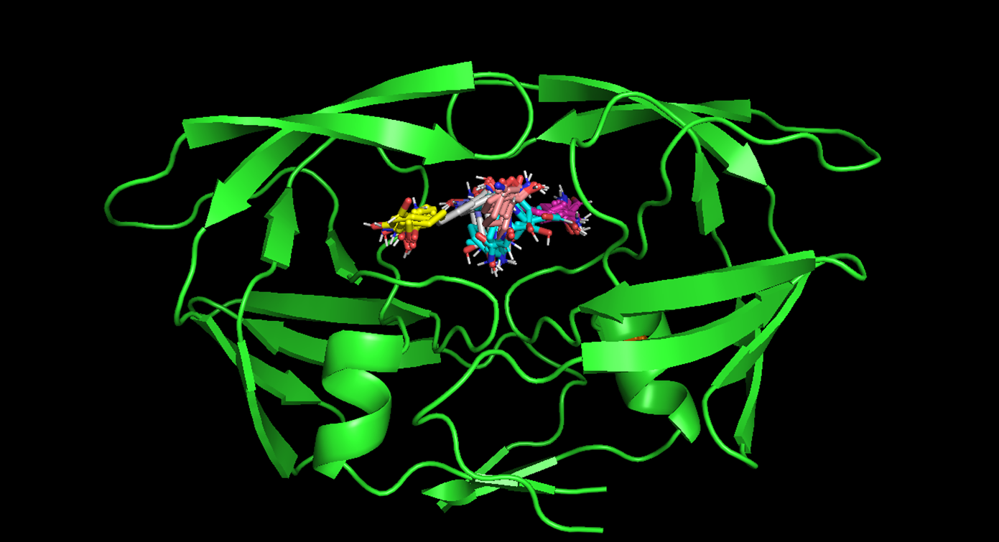

### **Command Mode Workflow**
The activity can also be automated using PyMOL’s command mode:

#### **PyMOL Commands to Open and Compare Files:**
```python
# Load the protein and FTMap results
load hivbinding.pdb, receptor
load ftmap*.pdb, ftmap_results

# Align the original structure with FTMap results
fetch 1QBR, original
align ftmap_results, original

# Highlight predicted binding sites
show spheres, ftmap_results
color red, ftmap_results

# Save the aligned structure
save aligned_ftmap.pdb
```

#### **FTMap Automation via Command Line:**
While FTMap primarily operates through its web interface, you can script tasks like uploading and processing files by interacting with its API (if available). Refer to the [FTMap GitHub documentation](https://github.com/labimm/DRUGpy) for details on potential integrations.

### **Outcome**
- You will have identified potential binding sites on the HIV protease receptor.
- Visualized and compared these sites with the crystal structure using PyMOL.
- Optionally, automated visualization and alignment using PyMOL commands.

### **Key Observations**
- Solvent molecules in FTMap results cluster in binding pockets.
- Multiple predicted pockets may indicate alternative binding sites.
- Comparing with the crystal structure helps validate predictions.

# ⏭  **Step 2: Grid Calculations - Preparing the Receptor Protein and Ligand**

In this step, you will prepare the receptor protein and ligand separately from the HIV-1 Protease structure (PDB ID: **1QBR**) using PyMOL. The receptor and ligand files will be used later for docking.

### **1. Prepare the Receptor Protein**

1. **Download the Protein Structure**:
   - Open PyMOL.
   - Go to `File > Get PDB`
   - Enter `1QBR` in the dialog box and download the structure.

2. **Identify and Remove the Ligand**:
   - Go to `Display > Sequence` to display the sequence bar at the top.
   - Locate **XV6**, the ligand, in the sequence bar and select it.
   - On the right-side menu, click `Action > Remove Atoms` to remove the ligand.

3. **Remove Water Molecules and Solvents**:
   If there are water molecules or other solvents, remove them using the following:
     - **Command Line**:
       ```bash
       remove solvent
       ```
     Or use the menu:
       - On the right side, select water or heteroatoms and choose **Action > Remove Atoms**.

4. **Save the Receptor Protein**:
   - Go to `File > Export Structure > Export Molecule**`
   - Save the structure as a PDB file:
     - **Save Type**: PDB
     - **File Name**: `hivreceptor.pdb`.

5. **Clear PyMOL for Next Steps**:
   - Go to `File > Reinitialize > Everything` to clear all molecules from the workspace.

### **2. Prepare the Ligand**

1. **Reload the Original Protein Structure**:
   - Go to **File > Get PDB**.
   - Enter `1QBR` again to reload the full structure.

2. **Isolate the Ligand**:
   - Go to `Display > Sequence` to display the sequence bar.
   - Select the entire protein sequence except **XV6**:
     - Be careful:
       - The protein sequence has two parts, one before and one after XV6.
       - Ensure you **do not delete XV6 (the ligand)**. If deleted, restart with the original `1QBR` file.
   - On the right-side menu, click `Action > Remove Atoms` to remove all protein atoms, leaving only the ligand.

3. **Save the Ligand**:
   - Go to `File > Export Structure > Export Molecule`
   - Save the structure as a PDB file:
     - **Save Type**: PDB
     - **File Name**: `hivligand.pdb`.

### **Important Notes**
- **File Integrity**: Ensure that you save the receptor as `hivreceptor.pdb` and the ligand as `hivligand.pdb`.
- **Error Handling**: If the ligand or protein is deleted by mistake, restart with the original PDB file (`1QBR`).
- **Accuracy**: Be precise when selecting the protein sequence around the ligand to avoid accidentally deleting XV6.

Both the receptor (`hivreceptor.pdb`) and ligand (`hivligand.pdb`) are now ready for docking or further analysis.

# ⏭  **Step 3: Using AutoDock with MGLTools Interface for Docking Ligand to the Receptor**

This step involves creating a grid for the docking calculation and preparing the ligand and receptor files using AutoDock MGLTools. You can run AutoGrid4 locally or explore running it on the cloud.

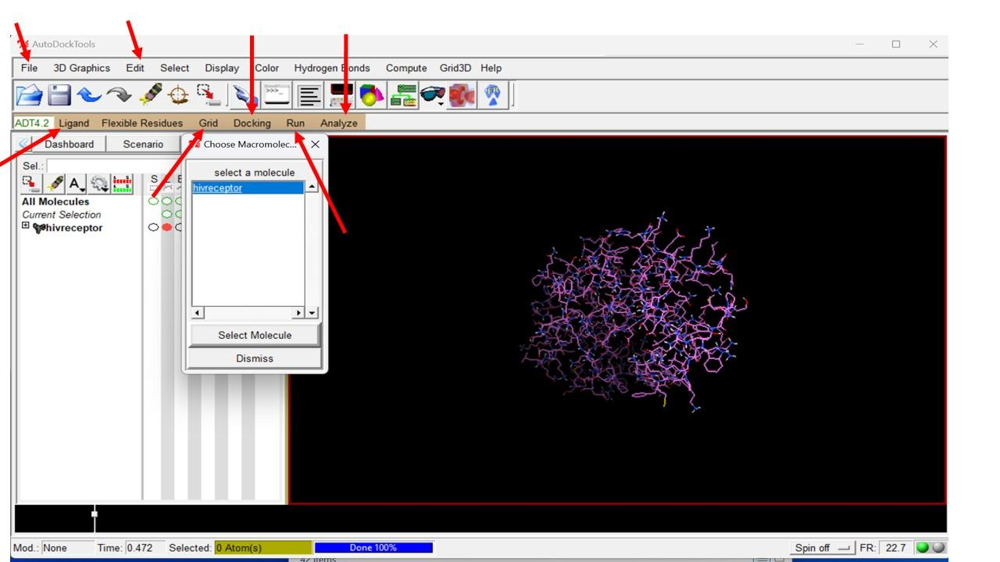

### **Grid Creation**
In docking, a **grid** defines the binding site region on the receptor protein for ligand docking.

#### **1. Open the Receptor File**
- Launch **AutoDock MGLTools**.
- Go to `File > Read Molecule` and open `hivreceptor.pdb`.
- The protein molecule will be displayed on the screen.

#### **2. Modify the Receptor**
- Go to the **Grid** menu and select **Select Molecule**:
   A modified molecule appears with an option to save as a `.pdbqt` file.
- Save the file:
   **File Name**: `hivreceptor.pdbqt`.

#### **3. Set Map Types**
- Navigate to `Grid > Set Map Types`:
   Select `Directly` and click `Accept`

#### **4. Create the Grid Box**
1. Go to `Grid > GridBox`: A window pops up for configuring the grid box.
2. **Adjust the Grid Box**:
   - To enclose the entire protein, adjust the number of points in the X, Y, and Z directions using the wheel.
     - Maximum number of points: **126**.
   - Alternatively, increase the **Spacing** to `1 Å` to enlarge the grid.
   - If targeting a specific binding site (e.g., predicted from FTMap), adjust the box accordingly.
3. Save the grid configuration: **File > Close Saving Current** (on the pop-up window).

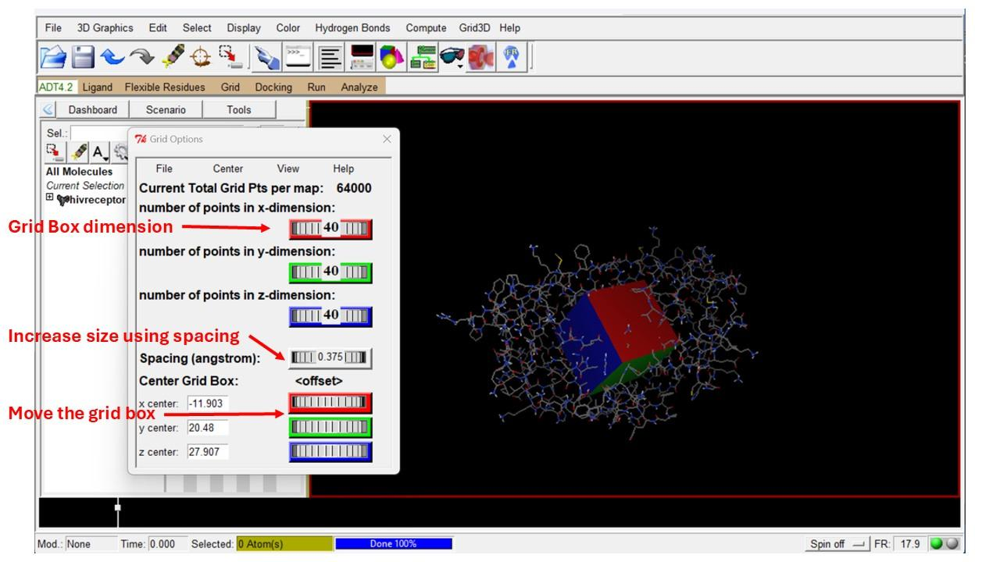

#### **5. Save the Grid Parameter File (GPF)**
- Go to `Grid > Output > Save GPF`
   Save the file as `hivreceptor.gpf`.
- Edit the GPF if needed:
   Go to `Grid > Edit GPF` to open and modify the parameter file.

#### **6. Clean Up Workspace**
1. To prepare for ligand processing: Go to `Edit > Delete Molecule` and delete the receptor molecule from the workspace.

### **Preparing the Ligand**

#### **1. Open the Ligand File**
- Go to `Ligand > Input > Open` and select `hivligand.pdb`.
- The ligand will display with a pop-up window. Click `OK`

#### **2. Define Torsions**
1. Navigate to `Ligand > Torsion Tree > Choose Torsions`:
   A window pops up highlighting rotatable bonds. Red bonds indicate non-rotatable bonds, while green bonds are rotatable.
2. Adjust torsions as needed:
   Specify rotatable bonds to explore ligand flexibility.
3. Click `Done`.

#### **3. Save the Ligand File**
1. Save the prepared ligand as: `File Name`: `hivligand.pdbqt`.

### **Setting Up the Grid**

#### **1. Load the Receptor**
1. Go to `Grid > Macromolecule > Open` and load `hivreceptor.pdbqt`.
2. When prompted to keep charges, select `Keep Old Charges`

#### **2. Load the GPF File**
1. Navigate to `Grid > Open GPF` and select `hivreceptor.gpf`.

### **Calculating the Grid**

#### **1. Run AutoGrid**
1. Go to `Run > Run AutoGrid`:
   - Select the `autogrid4` executable file.
   - Use `hivreceptor.gpf` as the input file.
   - Output file (`hivreceptor.glg`) is selected automatically.

2. Click `Launch` to start the grid calculation:
   - This process can take 1–30 minutes depending on the computational power and grid size.
   - `Note`: Test whether this can be run on Google Cloud. If not, it must be done locally.

#### **2. Verify the Grid Calculation**
1. Open the output file (`hivreceptor.glg`).
2. Scroll to the end of the file: Confirm the calculation completed successfully.

### **Important Notes**
- Ensure all `.pdbqt` files are correctly prepared for docking.
- Verify grid parameters for accuracy (grid box size, map types, etc.).
- Computational power impacts the time required for calculations:
  - For cloud-based execution, configure and test AutoDock compatibility with Google Cloud.

This completes the grid creation and ligand preparation steps required for docking. Proceed to the docking step to simulate ligand binding to the receptor.

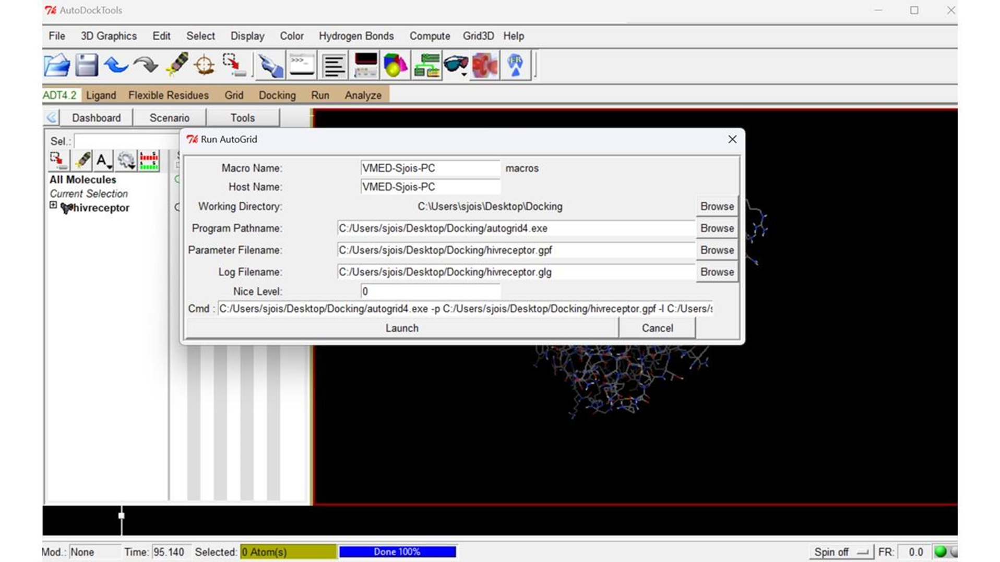

# ⏭ **Step 4: Docking Using AutoDock with MGLTools Interface**

This step involves docking the ligand to the receptor using AutoDock and MGLTools. You will configure docking parameters, save the docking files, and run the docking calculations locally or on the cloud.

### **Docking Setup**

#### **1. Load the Receptor**
- Open **AutoDock MGLTools**.
- Go to **Docking > Macromolecule > Set Rigid File Name**:
   - Select `hivreceptor.pdbqt` as the receptor file.

#### **2. Load the Ligand**
- Navigate to `Docking > Ligand > Open`:
   - Select `hivligand.pdbqt` as the ligand file.
- A pop-up window will appear. Click `Accept` to proceed.

#### **3. Configure Search Parameters**
Go to `Docking > Search Parameters`:
   - Modify the following settings based on your search preferences:
     - **Number of GA (Genetic Algorithm) Runs**: `50`.
     - **Maximum Number of Evaluations**: `10 million`.
   - Alternatively, use the default parameters and click `Accept`.

#### **4. Configure Docking Parameters**
- Navigate to `Docking > Docking Parameters`: Review and click `Accept` to proceed.

#### **5. Save the Docking Parameter File (DPF)**
Go to **Docking > Output > Lamarckian GA (1.2)**: Save the docking parameter file as `hivreceptordock.dpf`.

#### **6. Edit and Verify the DPF File**
Open the `.dpf` file to review the input parameters if needed:
   * Ensure the receptor, ligand, and other settings are correctly defined. Modify parameters if required.

### **Running the Docking Job**

#### **1. Launch AutoDock**
- Navigate to **Run > AutoDock**.
- Configure the run:
   - **Executable**: Select `autodock4`.
   - **Parameter File Name**: Choose `hivreceptordock.dpf`.
   - **Output File**: Automatically set to `hivreceptordock.dlg`.

- Click **Launch** to start the docking process.

#### **2. Check for Errors**
- If there is an issue with the parameters:
   - The formatting pop-up window will either not appear or will disappear immediately.
   - Review the `.dpf` file for errors and try again.

### **Estimated Runtime**
- On a standard laptop:
  - **50 Runs** with **10 Million Energy Evaluations**: Approximately **10–16 hours**.
- For faster results, consider running AutoDock on a cloud platform, such as Google Cloud, with higher computational resources.

### **Cloud Execution**
- Verify if AutoDock4 can be configured to run on a cloud platform.
- Use tools like SSH or Docker to set up and execute the job in a cloud environment.
- Ensure appropriate file paths and dependencies are configured before launching the docking job.

### **Output**
1. The docking output file `hivreceptordock.dlg` contains:
   - Binding energy values.
   - Binding conformations.
   - Detailed results for each genetic algorithm run.

2. Review the `.dlg` file to analyze docking results:
   - Look for the lowest energy pose and corresponding interactions.

By completing these steps, you will have successfully docked the ligand to the receptor and generated docking results for further analysis.